In [89]:
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.sparse import csr_matrix
import numpy as np
import pandas as pd
import seaborn as sns
import collections
import os
import pickle

In [90]:
import tcri
from genevector.data import GeneVectorDataset
from genevector.model import GeneVector
from genevector.embedding import GeneEmbedding, CellEmbedding
import grimoire as spell

## Configuration

In [91]:
#any without signed mi were  false
disease            = "scc"
subset             = "CD8"
signed_mi          = True
init_ortho         = True
entropy_threshold  = 1.5
mutual_information = "/Users/ceglian/Data/tcri/{}_{}_{}_{}.p".format(disease,subset,signed_mi,str(entropy_threshold).replace(".",""))
print(mutual_information)
adata_h5ad         = "/Users/ceglian/Data/tcri/yost.h5ad"
embedding_size     = 100
alpha              = 0.08
beta               = 0.02
gain               = 10
vector_file        = "/Users/ceglian/Data/tcri/{}_{}_{}_{}_{}_{}_{}_{}.vec".format(disease,embedding_size, alpha, beta, gain, subset, signed_mi, init_ortho)
print(vector_file)
retrain            = True
annotated_h5ad     = "/Users/ceglian/Data/tcri/{}_{}_annoated.h5ad".format(disease,subset)
device             = "cpu"


cd8 = ['CD8_act',
        'CD8_eff',
        'CD8_ex',
        'CD8_ex_act',
        'CD8_mem',
        'CD8_naive']
cd4 = ['Naive',
        'Tfh',
        'Th17',
        'Tregs']

/Users/ceglian/Data/tcri/scc_CD8_True_15.p
/Users/ceglian/Data/tcri/scc_100_0.08_0.02_10_CD8_True_True.vec


## Read SCC data

In [160]:
adata = sc.read(adata_h5ad)
adata.X = csr_matrix(adata.X)
adata = adata[adata.obs["disease"] == disease]
adata = spell.pp.remove_meaningless_genes(adata)

genes = [x for x in adata.var.index.tolist()]
genes = [x for x in genes if "TRAV" not in x]
genes = [x for x in genes if "TRAJ" not in x]
genes = [x for x in genes if "TRAD" not in x]


genes = [x for x in genes if "TRBV" not in x]
genes = [x for x in genes if "TRBJ" not in x]
genes = [x for x in genes if "TRBD" not in x]

genes = [x for x in genes if "TRGV" not in x]
genes = [x for x in genes if "TRGJ" not in x]
genes = [x for x in genes if "TRGD" not in x]

genes = [x for x in genes if "TRDV" not in x]
genes = [x for x in genes if "TRDJ" not in x]
genes = [x for x in genes if "TRDD" not in x]

adata = adata[:,genes]

tcri.pp.register_clonotype_key(adata,"trb")
adata = adata[adata.obs[adata.uns["tcri_clone_key"]]!="None"]
if subset == "CD8":
    adata = adata[adata.obs["cluster"].isin(cd8)]
else:
    adata = adata[adata.obs["cluster"].isin(cd4)]
adata
tcri.pp.gene_entropy(adata)
adata = adata[:,adata.var["entropy"] > 1.]
adata
dataset = GeneVectorDataset(adata,load_expression=True,signed_mi=signed_mi,device=device)

100%|██████████| 15828/15828 [00:02<00:00, 6399.10it/s]


Running...
Loading Expression.
Indexing expression.


100%|██████████| 7086750/7086750 [00:03<00:00, 1929119.17it/s]


Finished.


In [161]:
# if os.path.exists(vector_file):
#     retrain = False
#     print("found previous model.")
# print(len(dataset.mi_scores),len(adata.var.index))
if True:
    if os.path.exists(mutual_information):
        print("hit")
        dataset.mi_scores = pickle.load(open(mutual_information,"rb"))
    cmps = GeneVector(dataset,
                        output_file=vector_file,
                        emb_dimension=embedding_size,
                        gain=gain,
                        init_ortho=init_ortho,
                        device=device)
if not os.path.exists(mutual_information):
    pickle.dump(dict(dataset.mi_scores),open(mutual_information,"wb"))

hit
*****************
Loading Dataset.
*****************



100%|██████████| 1084/1084 [00:00<00:00, 4393.25it/s]


MI Loaded.
Loading Batches for Training.


100%|██████████| 586986/586986 [00:01<00:00, 408081.97it/s]


Ready to train.


**** Epoch 0 	Loss: 80006.03906
**** Epoch 100 	Loss: 8442.0238
**** Epoch 200 	Loss: 152.17936
**** Epoch 300 	Loss: 92.55729
**** Epoch 400 	Loss: 80.63373
**** Epoch 500 	Loss: 75.80305
**** Epoch 600 	Loss: 72.66212
**** Epoch 700 	Loss: 69.76838
**** Epoch 800 	Loss: 67.03185
**** Epoch 900 	Loss: 64.50503
Training complete!
Loading average of 1st and 2nd weights.


100%|██████████| 1084/1084 [00:00<00:00, 2125584.64it/s]


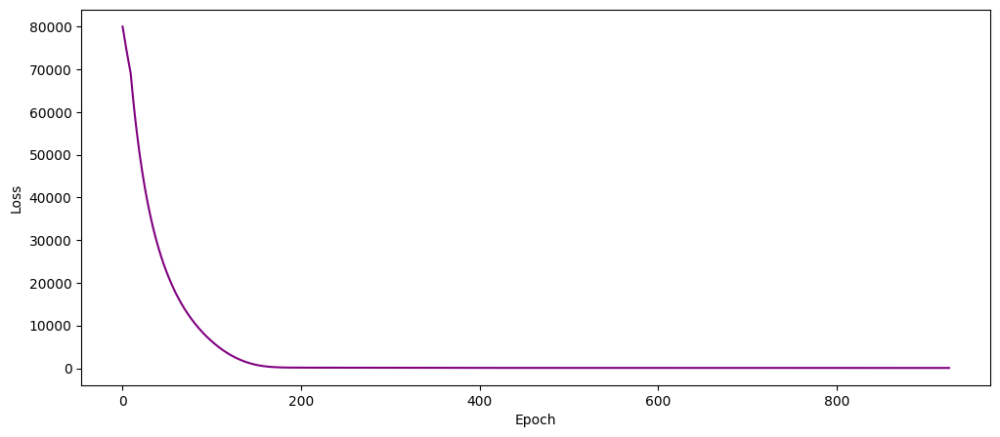

In [162]:
if True:
    cmps.train(100000,threshold=1e-3,alpha=alpha, beta=beta, update_interval=100)
    embed = GeneEmbedding(vector_file, dataset, vector="average")
    cmps.plot()

In [163]:
embed = GeneEmbedding(vector_file, dataset, vector="average")
cembed = CellEmbedding(dataset, embed)
adata = cembed.get_adata()
adata

Loading average of 1st and 2nd weights.


100%|██████████| 7086750/7086750 [00:13<00:00, 513406.97it/s]


Generating Cell Vectors.


100%|██████████| 12889/12889 [00:04<00:00, 2885.66it/s]


Found 0 Cells with No Counts.
Finished.
Loading embedding in X_genevector.
Running Scanpy neighbors and umap.


AnnData object with n_obs × n_vars = 12889 × 1084
    obs: 'cell.id', 'patient', 'treatment', 'cluster', 'UMAP1', 'UMAP2', 'trb', 'trb2', 'disease', 'response'
    var: 'entropy'
    uns: 'cluster_colors', 'tcri_clone_key', 'tcri_unique_clonotypes', 'neighbors', 'umap'
    obsm: 'X_umap', 'X_genevector'
    obsp: 'distances', 'connectivities'

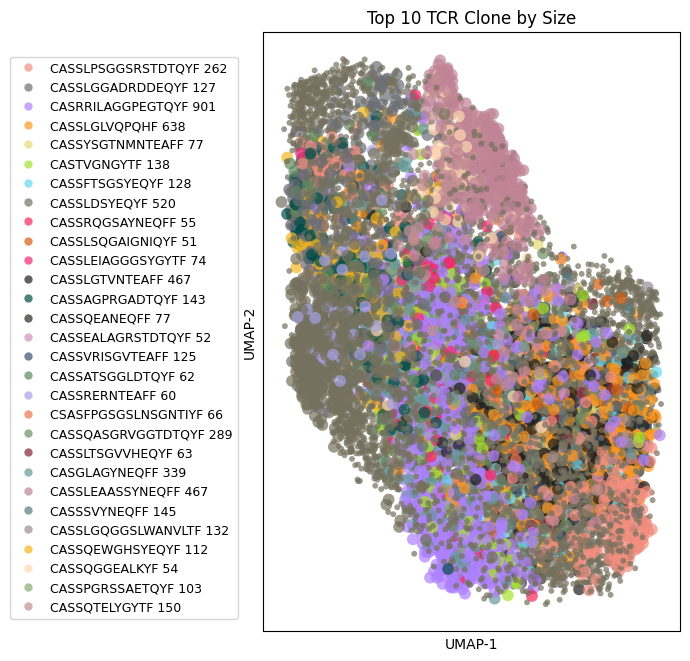

In [164]:
tcri.pl.clone_umap(adata,top_n=30,size=5,figsize=(7,7))

In [165]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

In [180]:
markers = dict()
markers["Naive"] = ["IL7R"]
markers["Memory"] = ["GZMK"]
markers["Activated"] = ["GZMB"]
markers["Dysfunctional"] = ["CXCL13"]
adata, dist = cembed.phenotype_probability(adata, markers, method="normalized_exponential", return_distances=True)

Using Normalized Exponential (Temp: 0.05)
Computing similarities for Naive
Markers: IL7R


100%|██████████| 12889/12889 [00:00<00:00, 53218.10it/s]


Computing similarities for Memory
Markers: GZMK


100%|██████████| 12889/12889 [00:00<00:00, 60061.75it/s]


Computing similarities for Activated
Markers: GZMB


100%|██████████| 12889/12889 [00:00<00:00, 61570.86it/s]


Computing similarities for Dysfunctional
Markers: CXCL13


100%|██████████| 12889/12889 [00:00<00:00, 63300.85it/s]


<Axes: xlabel='genevector', ylabel='count'>

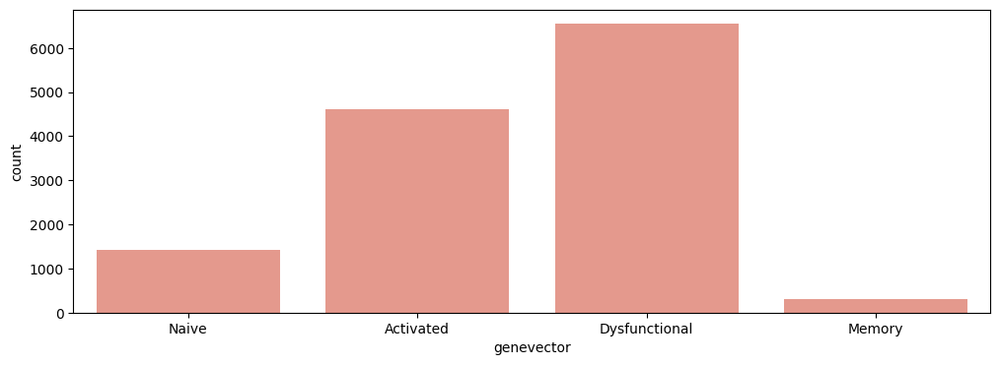

In [181]:
fig,ax=plt.subplots(1,1,figsize=(12,4))
sns.countplot(data=adata.obs, x="genevector",ax=ax)

<Axes: xlabel='cluster', ylabel='count'>

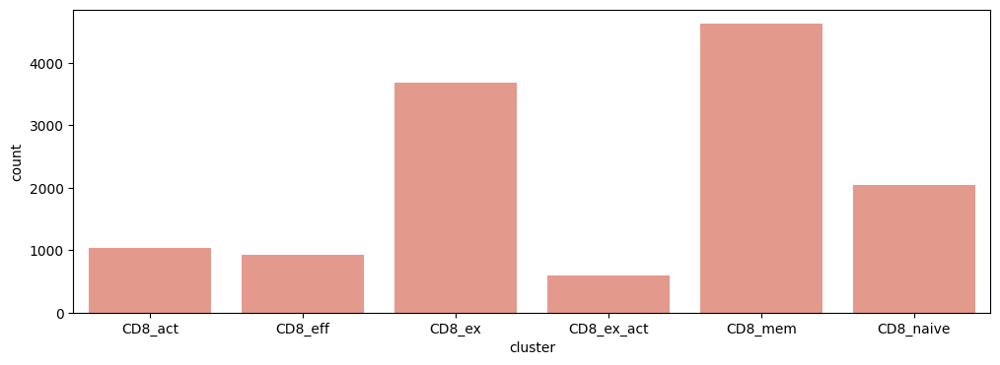

In [182]:
fig,ax=plt.subplots(1,1,figsize=(12,4))
sns.countplot(data=adata.obs, x="cluster",ax=ax)

<Axes: xlabel='genevector', ylabel='cluster'>

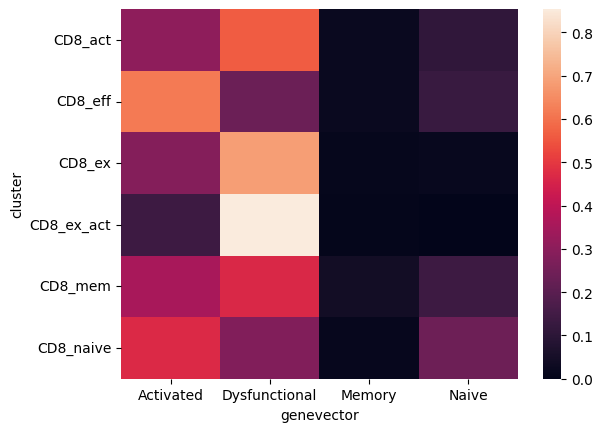

In [183]:

cembed.compare_classification(adata,"cluster","genevector")

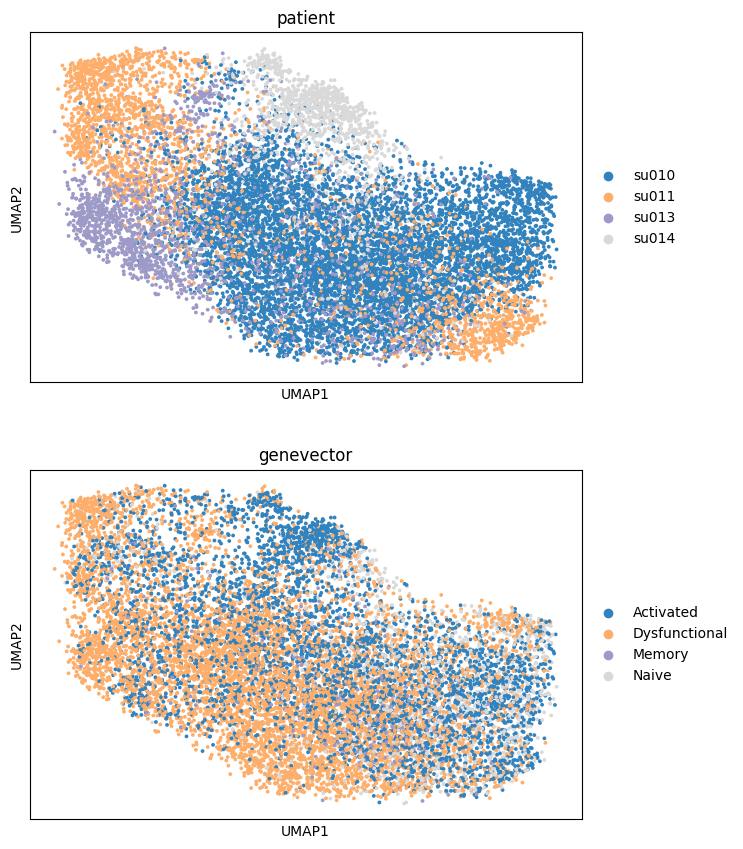

In [184]:
sc.pl.umap(adata,color=["patient","genevector"],s=30,wspace=0.2, ncols=1,palette="tab20c")

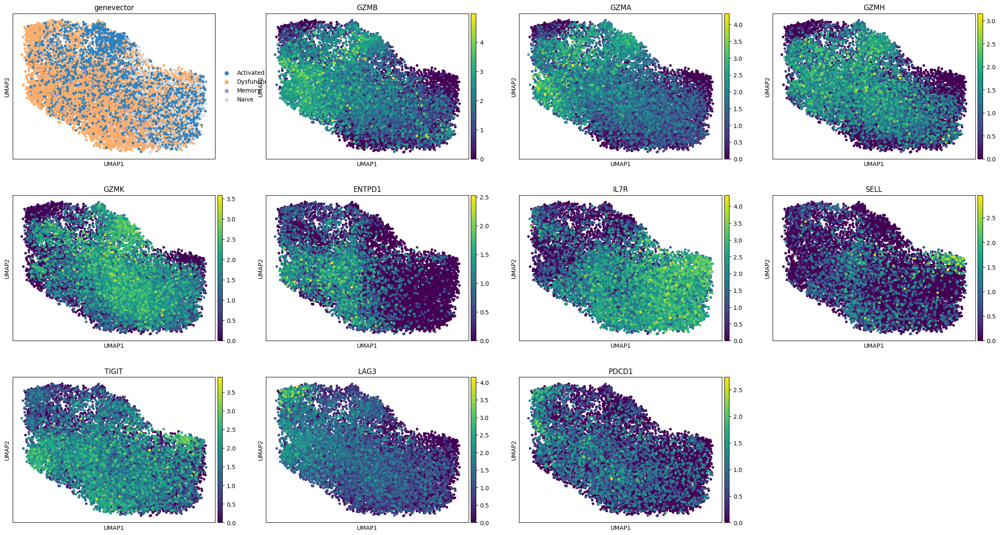

In [173]:
sc.pl.umap(adata,color=["genevector","GZMB","GZMA","GZMH","GZMK",
                        "ENTPD1","IL7R","SELL","TIGIT",
                        "LAG3","PDCD1"],s=80)

<Axes: xlabel='genevector', ylabel='count'>

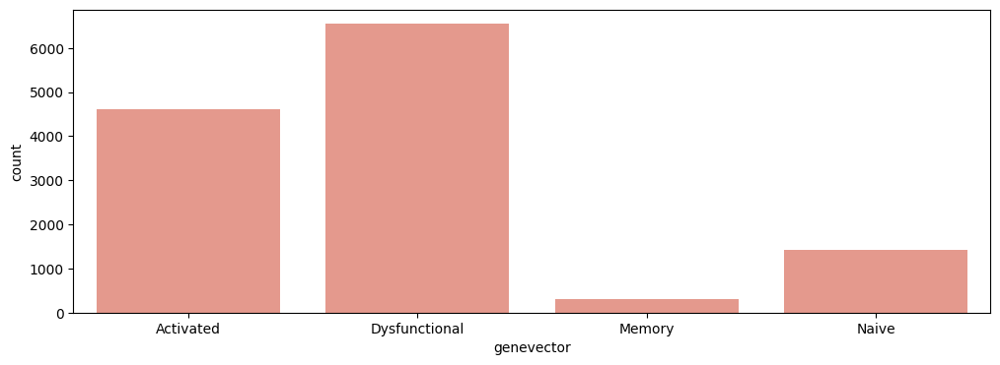

In [174]:
fig,ax=plt.subplots(1,1,figsize=(12,4))
sns.countplot(data=adata.obs, x="genevector",ax=ax)


  0%|          | 0/12889 [00:00<?, ?it/s]

100%|██████████| 12889/12889 [00:00<00:00, 66194.90it/s]


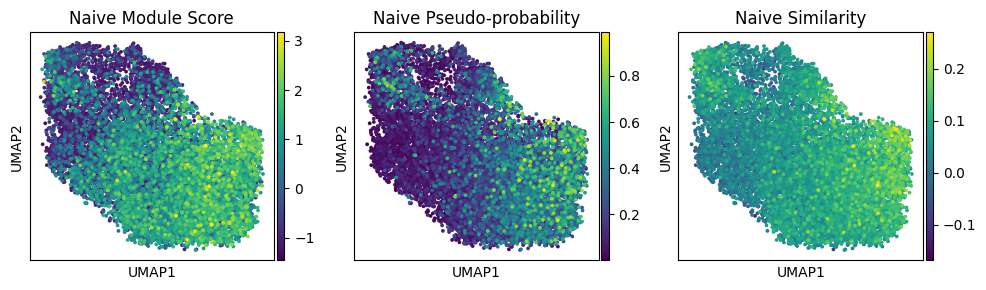

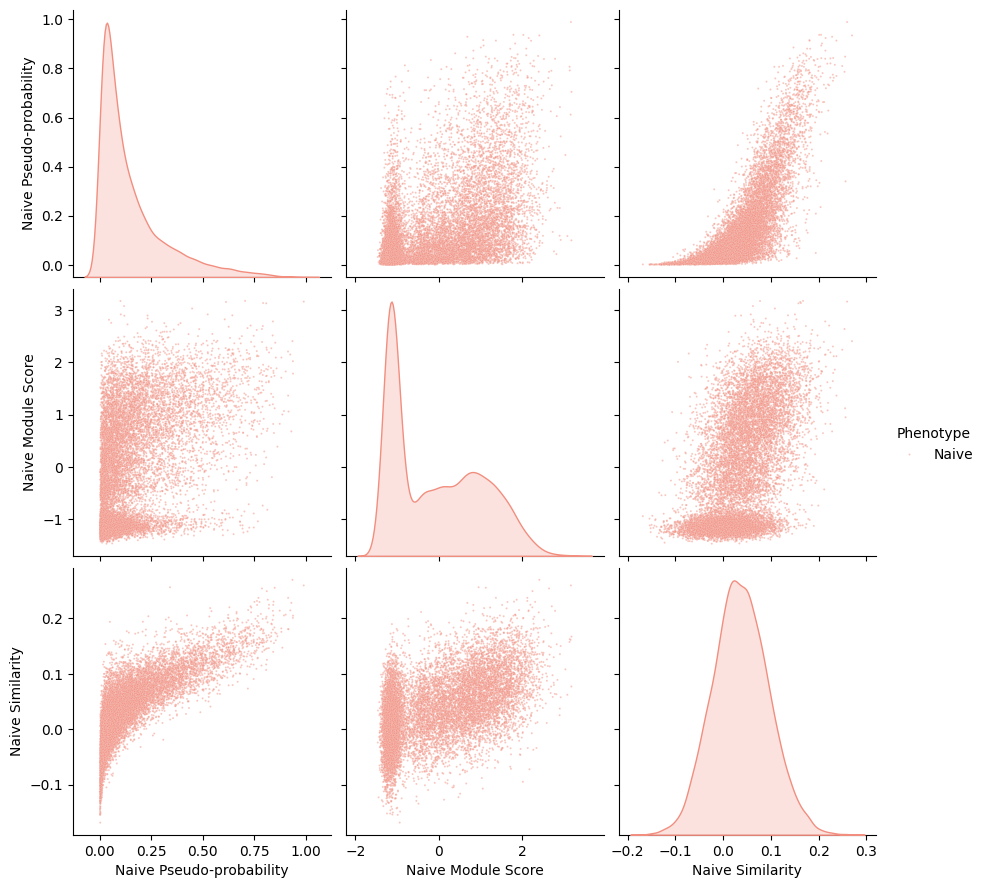

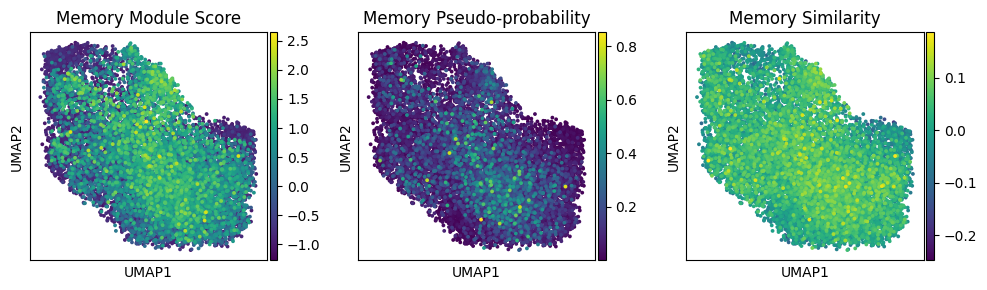

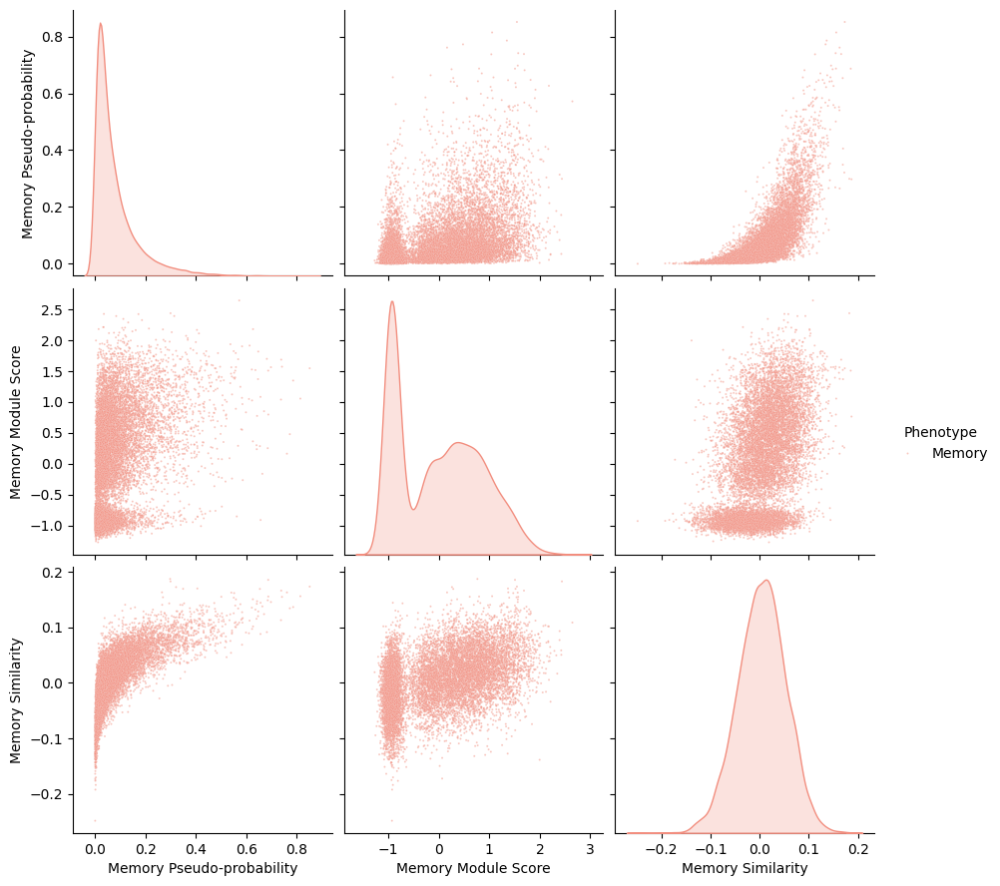

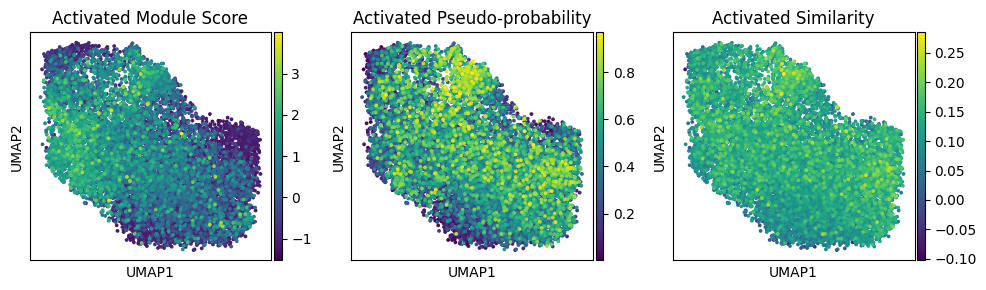

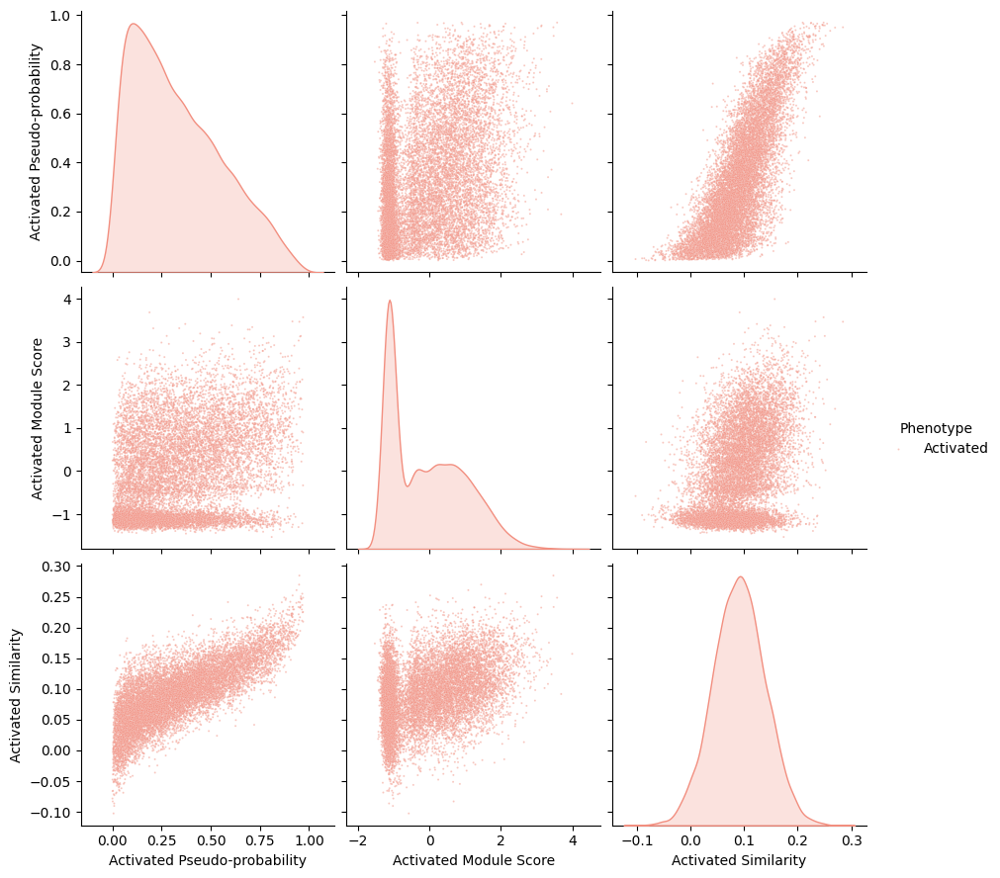

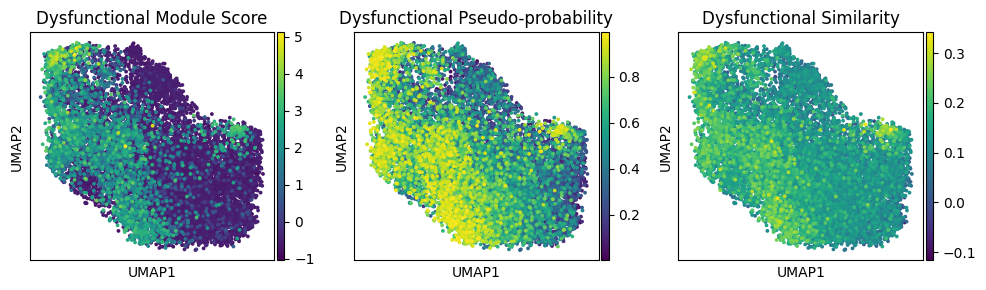

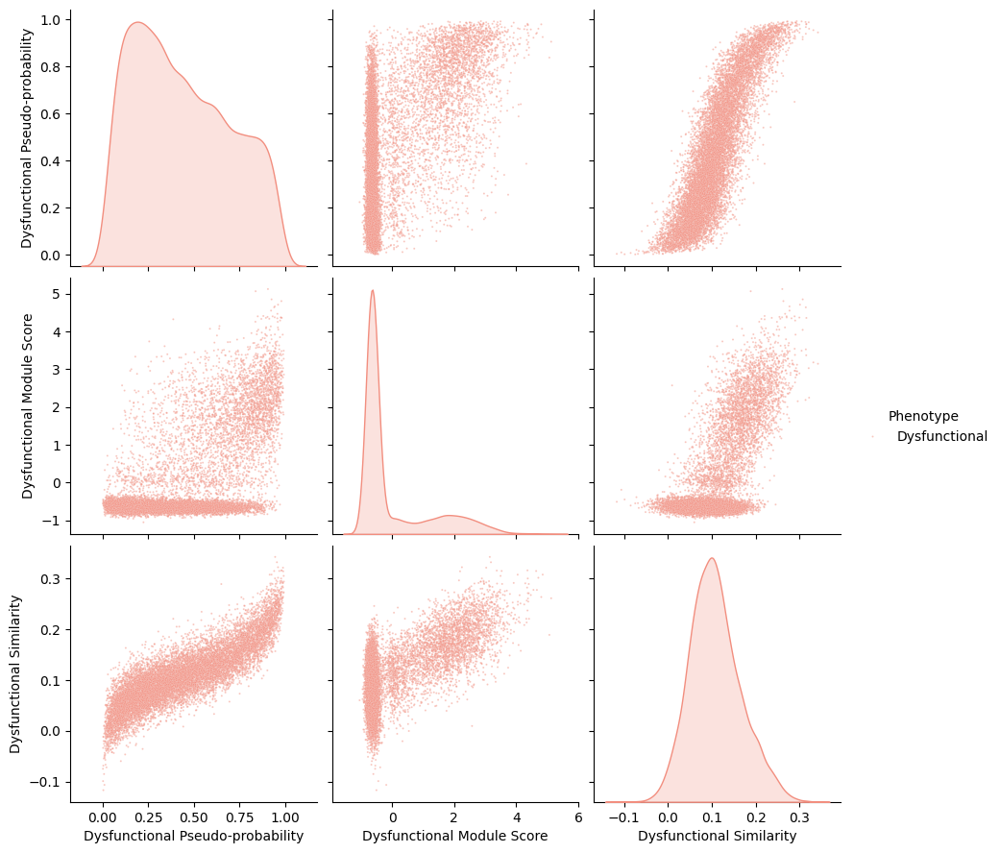

In [185]:
for phenotype, genes  in markers.items():
    cembed.phenotype_qc(adata,phenotype,genes)

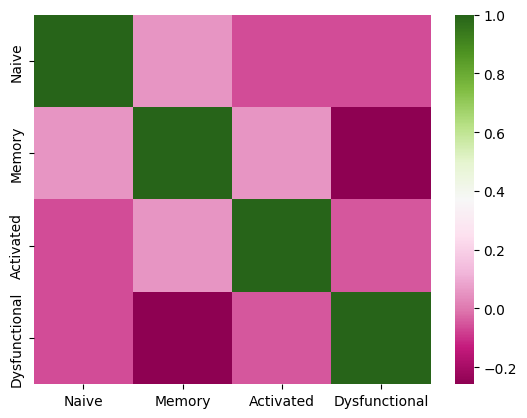

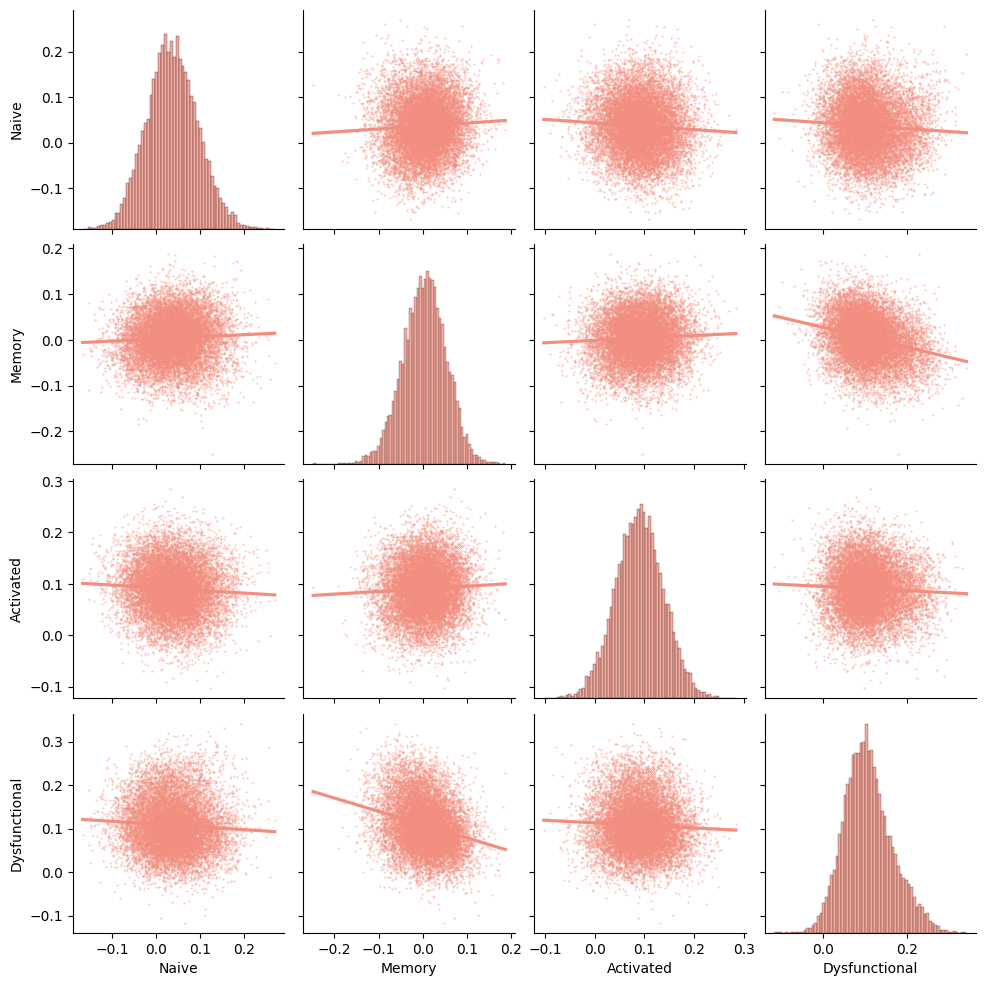

In [186]:
ddf = pd.DataFrame(data = np.array(dist["distances"]),columns=dist['order'])
mat = pd.DataFrame(np.corrcoef(ddf.to_numpy().T),index=dist["order"],columns=dist["order"])
sns.heatmap(mat,cmap="PiYG")
sns.pairplot(data=ddf,kind="reg",plot_kws={"scatter_kws":{"s":0.1}})

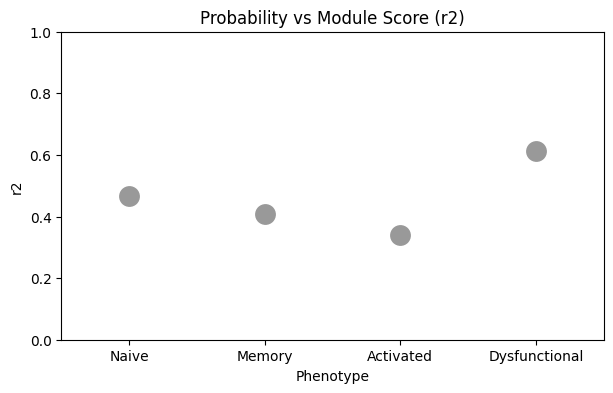

In [187]:
cembed.module_score_r2(adata,markers)

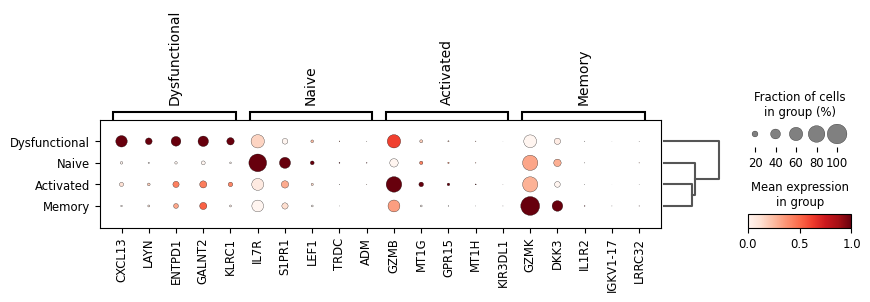

In [188]:
sc.tl.rank_genes_groups(adata,"genevector")
sc.tl.dendrogram(adata,"genevector")
sc.pl.rank_genes_groups_dotplot(adata,min_logfoldchange=1.,standard_scale='var',n_genes=5)

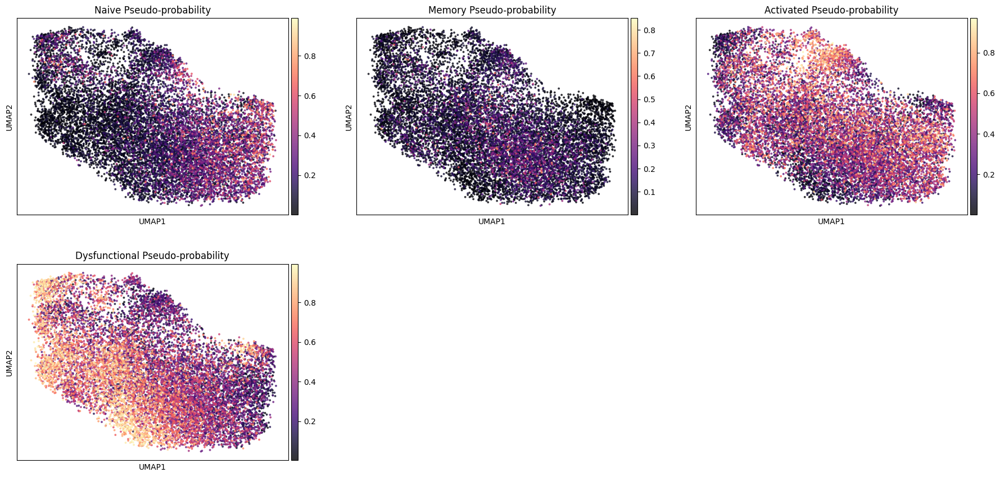

In [189]:

cembed.plot_probabilities(adata)

In [190]:
tcri.pp.register_phenotype_key(adata,"genevector")
tcri.pp.register_clonotype_key(adata,"trb")

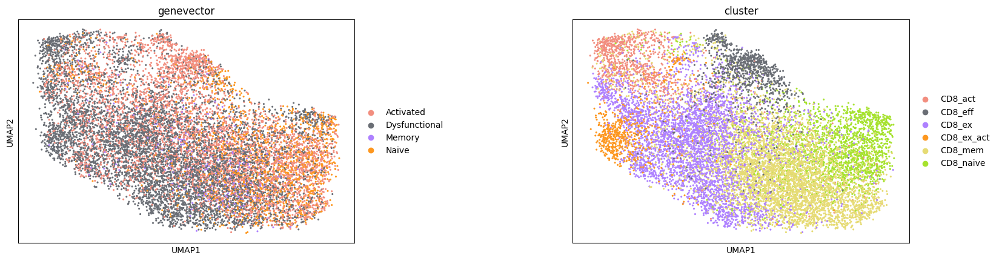

In [191]:
sc.pl.umap(adata,color=["genevector","cluster"],palette=tcri.pl.tcri_colors,s=20, wspace=0.5)

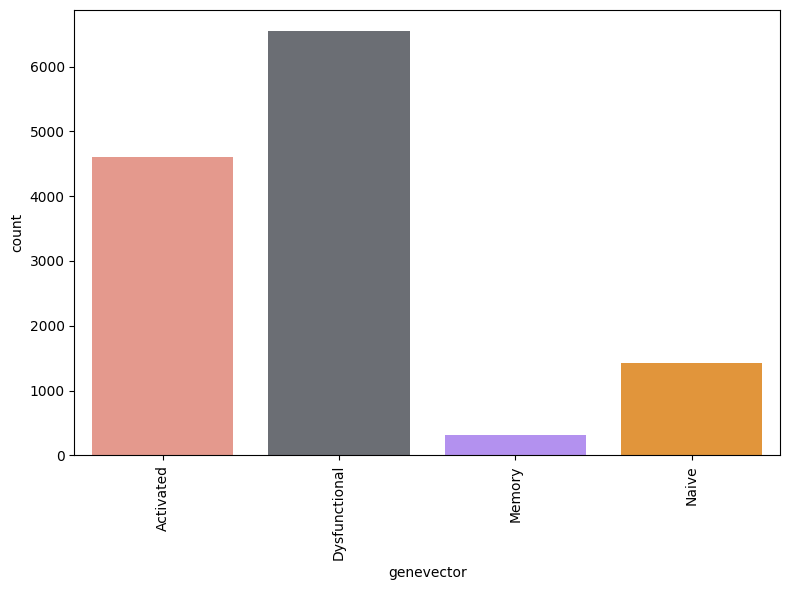

In [192]:
fig,ax = plt.subplots(1,1,figsize=(8,6))
sns.countplot(data=adata.obs,x="genevector",palette=tcri.pl.tcri_colors,ax=ax)
plt.xticks(rotation=90)
fig.tight_layout()

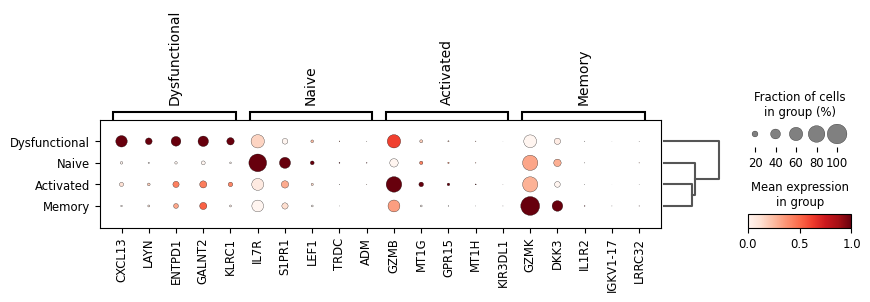

In [193]:
sc.tl.rank_genes_groups(adata,"genevector")
sc.tl.dendrogram(adata,"genevector")
sc.pl.rank_genes_groups_dotplot(adata,min_logfoldchange=1.,standard_scale='var',n_genes=5)

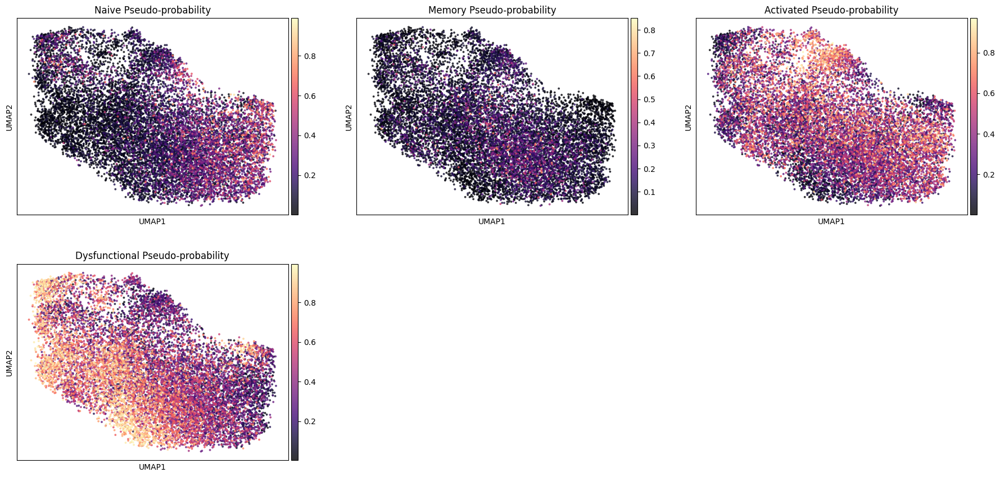

In [194]:

cembed.plot_probabilities(adata)

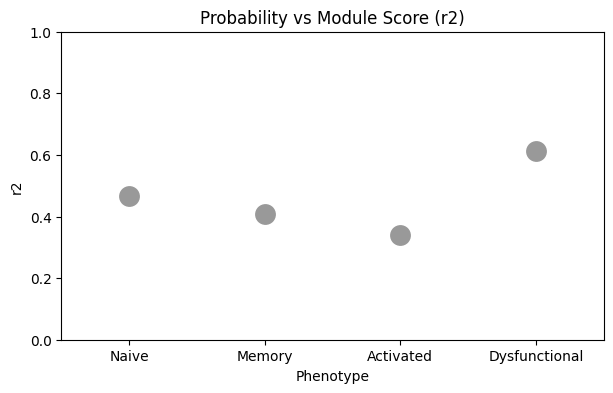

In [195]:
cembed.module_score_r2(adata,markers)

In [196]:
tcri.pp.clone_size(adata)

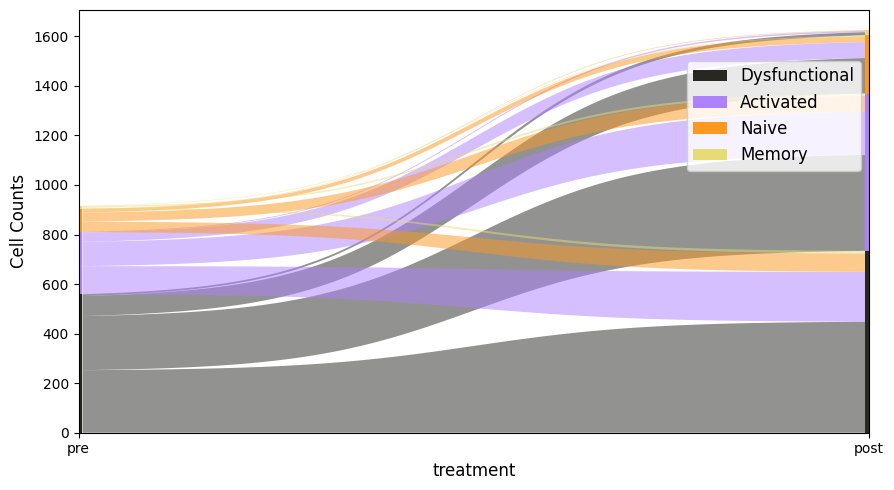

In [198]:
responder = adata[adata.obs["response"] == "Yes (CR)"]
#responder = responder[responder.obs["clone_size"] > 1]
tcri.pl.phenotypic_flux(responder,splitby="treatment",order=["pre","post"], nt=False,normalize=False)

901


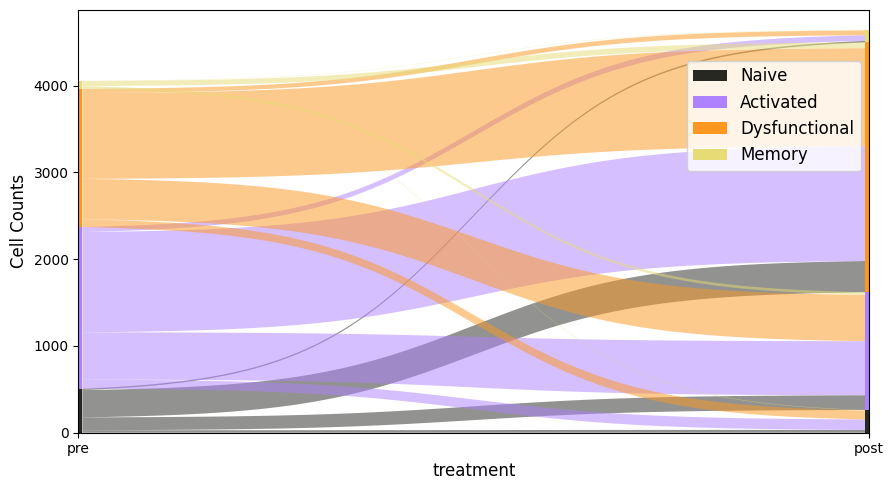

In [199]:
responder = adata[adata.obs["response"] == "No"]
print(max(responder.obs["clone_size"]))
responder = responder[responder.obs["clone_size"] > 1]
tcri.pl.phenotypic_flux(responder,splitby="treatment",order=["pre","post"],nt=False, normalize=False)

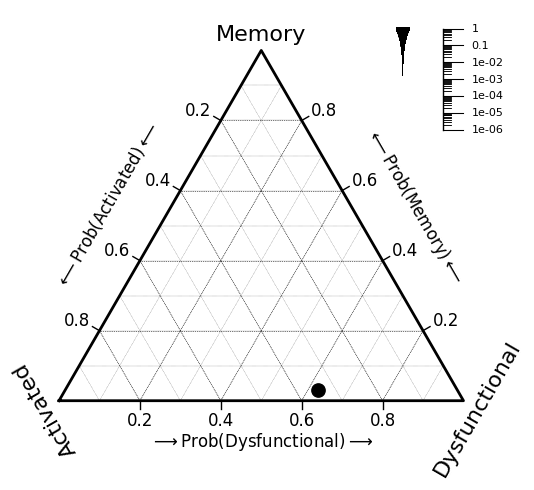

In [200]:
tcri.pl.ternary_plot(adata,phenotype_names=["Memory","Activated","Dysfunctional"],splitby="treatment",condition="post")

<Axes: title={'center': 'Clonality'}, xlabel='Phenotype', ylabel='Clonality'>

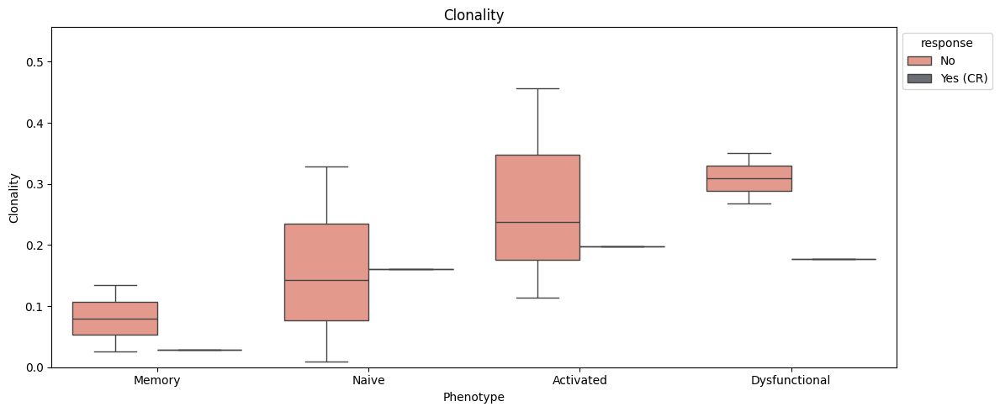

In [201]:
tcri.pl.clonality(adata, groupby="patient",splitby="response")

100%|██████████| 4/4 [00:01<00:00,  2.43it/s]


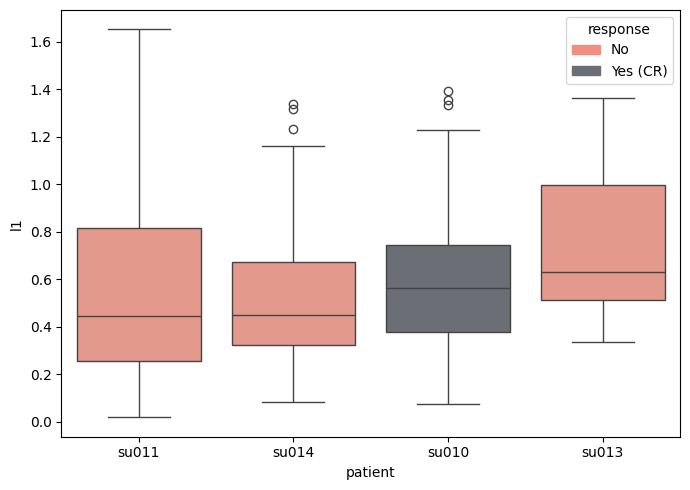

In [202]:
tcri.pl.flux(adata, key="treatment", from_this="pre", to_that="post", groupby="patient", method="probabilistic", distance_metric="l1",paint="response",figsize=(7,5))
plt.savefig("/Users/ceglian/flux_l1.pdf")

100%|██████████| 4/4 [00:01<00:00,  2.55it/s]


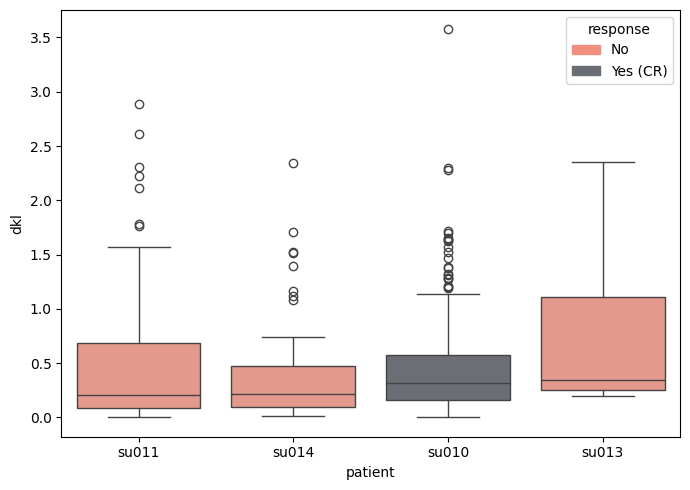

In [203]:
tcri.pl.flux(adata, key="treatment", from_this="pre", to_that="post", groupby="patient", method="probabilistic", distance_metric="dkl",paint="response",figsize=(7,5))
plt.savefig("/Users/ceglian/flux_l1.pdf")

100%|██████████| 2/2 [00:01<00:00,  1.09it/s]


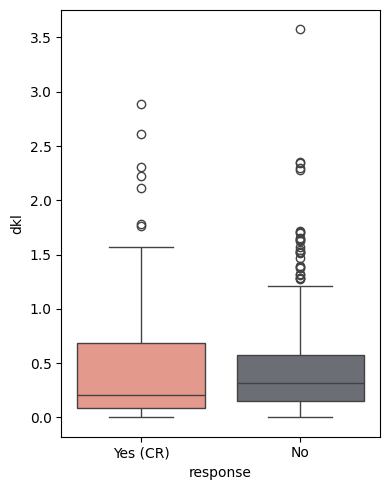

In [204]:
tcri.pl.flux(adata, key="treatment", from_this="pre", to_that="post", groupby="response", method="probabilistic", distance_metric="dkl",figsize=(4,5))
plt.savefig("/Users/ceglian/dkl_response.pdf")

100%|██████████| 2/2 [00:01<00:00,  1.05it/s]


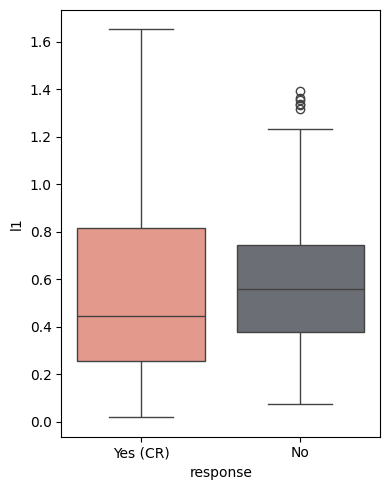

In [205]:
tcri.pl.flux(adata, key="treatment", from_this="pre", to_that="post", groupby="response", method="probabilistic", distance_metric="l1",figsize=(4,5))
plt.savefig("/Users/ceglian/dkl_response.pdf")

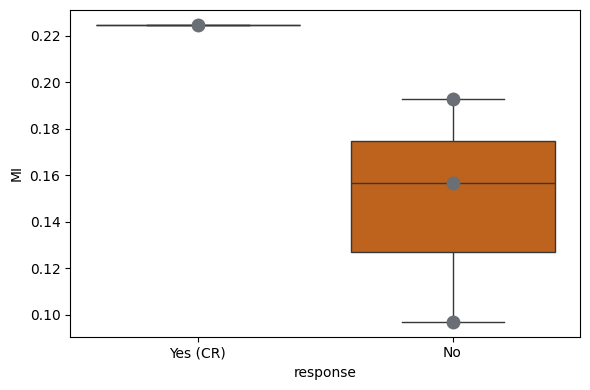

In [206]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from statannot import add_stat_annotation
import matplotlib.patches as mpatches

from gseapy import dotplot
import tqdm

import collections
import operator
import itertools

def mutual_information(adata, groupby, splitby=None, method="probabilistic", figsize=(6,5)):
    mis = []
    groups = []
    splits = []
    for group in set(adata.obs[groupby]):
        gdata = adata[adata.obs[groupby] == group]
        if splitby != None:
            for split in set(gdata.obs[splitby]):
                sdata = gdata[gdata.obs[splitby] == split]
                tcri.pp.joint_distribution(sdata)
                mi = tcri.tl.mutual_information(sdata, method=method)
                mis.append(mi)
                groups.append(group)
                splits.append(split)
        else:
            tcri.pp.joint_distribution(gdata, )
            mi = tcri.tl.mutual_information(gdata,method=method)
            mis.append(mi)
            groups.append(group)
    df = pd.DataFrame.from_dict({"MI":mis, groupby: groups})
    if splitby != None:
        df[splitby] = splits
    order = list(set(adata.obs[splitby]))
    fig, ax = plt.subplots(1,1,figsize=figsize)

    sns.boxplot(data=df,x=splitby,y="MI",ax=ax,order=order,palette="Dark2")
    sns.swarmplot(data=df,x=splitby,y="MI",order=order,s=10)
    pairs = list(itertools.combinations(list(set(order)),2))
    # ax, test_results = add_stat_annotation(ax, 
    #                                         data=df,
    #                                         x=splitby,
    #                                         y="MI", 
    #                                         order=order,
    #                                         box_pairs=pairs, 
    #                                         test='Mann-Whitney', 
    #                                         text_format='star', 
    #                                         loc='outside', 
    #                                         verbose=2)
    fig.tight_layout()
    return ax

mutual_information(adata, groupby="patient",splitby="response",figsize=(6,4))
plt.savefig("/Users/ceglian/mutual_info.pdf")

In [209]:
groupby = "patient"

def phenotypic_entropies(adata, method="probabilistic", normalized=True):
    tcri.pp.joint_distribution(adata, method=method)
    tcr_sequences = adata.obs[adata.uns["tcri_clone_key"]].tolist()
    unique_tcrs = np.unique(tcr_sequences)
    jd = adata.uns["joint_distribution"].to_numpy() 
    jd = jd / np.sum(jd)
    clonotype_entropies = np.zeros(jd.shape[1])
    max_entropy = np.log(jd.shape[0])
    for i, clonotype_distribution in enumerate(jd.T):
        normalized_distribution = clonotype_distribution / np.sum(clonotype_distribution)
        epsilon = np.finfo(float).eps
        if normalized:
            clonotype_entropies[i] = -np.sum(normalized_distribution * np.log(normalized_distribution + epsilon)) / max_entropy
        else:
            clonotype_entropies[i] = -np.sum(normalized_distribution * np.log(normalized_distribution + epsilon))
    tcr_to_entropy_dict = dict(zip(unique_tcrs, clonotype_entropies))
    return tcr_to_entropy_dict


ps = []
rs = []
r2 = []
for r in set(adata.obs["response"]):
    rdata = adata[adata.obs["response"] == r]
    for p in set(rdata.obs[groupby]):
        clone = []
        size = []
        ent = []
        pdata = rdata[rdata.obs[groupby] == p]
        ents = phenotypic_entropies(pdata)
        tcri.pp.clone_size(pdata)
        sizes = dict(zip(pdata.obs[pdata.uns["tcri_clone_key"]],pdata.obs["clone_size"]))
        for tcr,entropy in ents.items():
            ent.append(entropy)
            size.append(sizes[tcr])
            clone.append(tcr)
        df = pd.DataFrame.from_dict({"Entropy":ent,"Size":size,"TCR":clone})
        c = df["Entropy"].corr(df["Size"])
        ps.append(p)
        rs.append(r)
        r2.append(c)
df = pd.DataFrame.from_dict({"Patient":ps,"Response":rs,"Coefficient":r2})
df

,Patient,Response,Coefficient
0,su011,Yes (CR),0.050061
1,su014,No,0.084937
2,su013,No,-0.012774
3,su010,No,0.050843


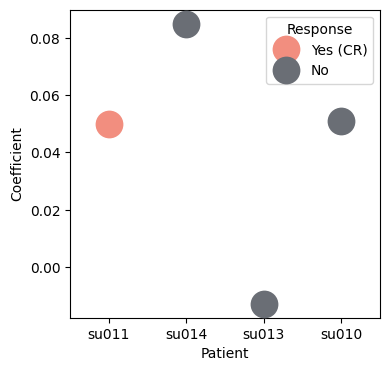

In [213]:
fig, ax = plt.subplots(1,1,figsize=(4,4))
sns.stripplot(data=df, x="Patient",y="Coefficient",s=20, hue="Response",ax=ax)
fig.savefig("/Users/ceglian/phenotypic_entropy.pdf")

<Axes: title={'center': 'Clonality'}, xlabel='Phenotype', ylabel='Clonality'>

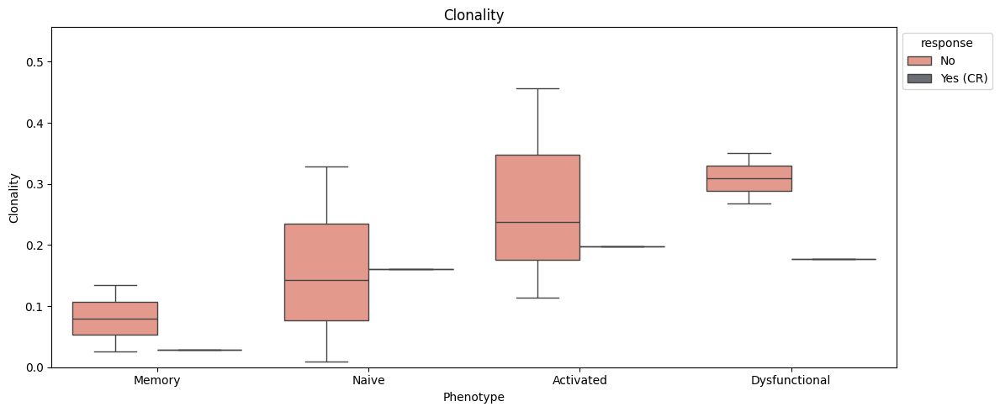

In [215]:
tcri.pl.clonality(adata,groupby="patient",splitby="response")